#### The files needed to work with this Jupyter notebook can be downloaded from here:
#### https://drive.google.com/drive/folders/1duLAbCZxlSuV555XSgNptpNyLwX0CN2g?usp=sharing

#### The full description of the dataset can be found here:
#### https://gitlab.medianets.hu/anagy/incident_dataset

# Importing Necessary Packages

In [5]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
traffic_data = pd.read_parquet("/content/drive/MyDrive/traffic_data.parquet")
incident = pd.read_csv("/content/drive/MyDrive/incidents.csv")

# Read the Data

# Data Preview

In [ ]:
traffic_data

,speed,occ,flow,station_id,timestamp
0,67.7,0.0373,105.0,318484,2016-01-01 00:00:00
1,66.9,0.0421,125.0,318484,2016-01-01 00:05:00
2,67.1,0.0399,125.0,318484,2016-01-01 00:10:00
3,66.8,0.0438,140.0,318484,2016-01-01 00:15:00
4,66.9,0.0461,160.0,318484,2016-01-01 00:20:00
...,...,...,...,...,...
31138267,69.0,0.0159,103.0,316414,2016-12-31 23:35:00
31138268,68.8,0.0157,103.0,316414,2016-12-31 23:40:00
31138269,69.5,0.0140,94.0,316414,2016-12-31 23:45:00
31138270,68.9,0.0159,102.0,316414,2016-12-31 23:50:00


#### speed: Measured average speed
#### occ: Measured average occupancy
#### flow: Measured total flow
#### station_id: Identifier of the detector
#### timestamp: The timestamp of the measurement


In [ ]:
incident

,Unnamed: 0,incident_id,cc_code,timestamp,description,latitude,longitude,district,freeway_nmbr,freeway_direction,...,up_distance,up_latitude,up_longitude,down_id,down_lanes,down_distance,down_latitude,down_longitude,active_onramp,active_offramp
0,0,16175990,SAHB,2016-01-01 16:30:00,1179-Trfc Collision-1141 Enrt,38.280275,-121.456931,3.0,5,N,...,-1.607,38.257363,-121.448669,319227,2,0.101,38.281219,-121.457043,False,False
1,1,16177033,SAHB,2016-01-02 13:25:00,1183-Trfc Collision-Unkn Inj,39.314110,-120.447967,3.0,80,W,...,3.203,39.325458,-120.392564,319430,2,-5.605,39.310097,-120.544000,True,True
2,2,16177599,SAHB,2016-01-02 19:00:00,1182-Trfc Collision-No Inj,38.603209,-121.435469,3.0,51,S,...,0.196,38.605475,-121.433198,314157,4,-0.271,38.600753,-121.438775,True,True
3,3,16182414,SAHB,2016-01-08 07:45:00,1179-Trfc Collision-1141 Enrt,38.343525,-121.335578,3.0,99,N,...,-0.730,38.333162,-121.330741,317660,2,0.730,38.352842,-121.340605,False,False
4,4,16183558,SAHB,2016-01-08 17:10:00,1182-Trfc Collision-No Inj,38.560374,-121.481408,3.0,50,E,...,-0.477,38.562532,-121.489560,318282,4,0.122,38.559773,-121.479137,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,447,16907027,SAHB,2016-12-26 13:05:00,1179-Trfc Collision-1141 Enrt,38.758050,-121.261450,3.0,80,E,...,-0.126,38.756912,-121.262242,318844,4,0.070,38.759443,-121.260582,False,False
448,448,16908065,SAHB,2016-12-27 05:50:00,1179-Trfc Collision-1141 Enrt,38.249222,-121.290476,3.0,99,S,...,0.350,38.253209,-121.292972,317640,2,-0.134,38.246918,-121.288935,False,False
449,449,16908856,SAHB,2016-12-27 14:15:00,1179-Trfc Collision-1141 Enrt,38.651912,-121.370190,3.0,80,W,...,0.200,38.653680,-121.368403,314165,2,-0.895,38.645422,-121.384400,False,False
450,450,16911088,SAHB,2016-12-28 18:05:00,1183-Trfc Collision-Unkn Inj,38.596708,-121.549171,3.0,80,W,...,0.477,38.603117,-121.544779,317885,3,-0.613,38.589094,-121.554290,False,False


# Traffic Data Preprocessing and Exploaration

In [ ]:
traffic_data["timestamp"] = pd.to_datetime(traffic_data["timestamp"])
traffic_data['month'] = traffic_data['timestamp'].dt.month
traffic_data['day'] = traffic_data['timestamp'].dt.day
traffic_data['hour'] = traffic_data['timestamp'].dt.hour
traffic_data['minute'] = traffic_data['timestamp'].dt.minute
traffic_data['dayofweek'] = traffic_data['timestamp'].dt.dayofweek
traffic_data

,speed,occ,flow,station_id,timestamp,month,day,hour,minute,dayofweek
0,67.7,0.0373,105.0,318484,2016-01-01 00:00:00,1,1,0,0,4
1,66.9,0.0421,125.0,318484,2016-01-01 00:05:00,1,1,0,5,4
2,67.1,0.0399,125.0,318484,2016-01-01 00:10:00,1,1,0,10,4
3,66.8,0.0438,140.0,318484,2016-01-01 00:15:00,1,1,0,15,4
4,66.9,0.0461,160.0,318484,2016-01-01 00:20:00,1,1,0,20,4
...,...,...,...,...,...,...,...,...,...,...
31138267,69.0,0.0159,103.0,316414,2016-12-31 23:35:00,12,31,23,35,5
31138268,68.8,0.0157,103.0,316414,2016-12-31 23:40:00,12,31,23,40,5
31138269,69.5,0.0140,94.0,316414,2016-12-31 23:45:00,12,31,23,45,5
31138270,68.9,0.0159,102.0,316414,2016-12-31 23:50:00,12,31,23,50,5


### Study the Data Distrribution

array([[<Axes: title={'center': 'speed'}>,
        <Axes: title={'center': 'occ'}>],
       [<Axes: title={'center': 'flow'}>, <Axes: >]], dtype=object)

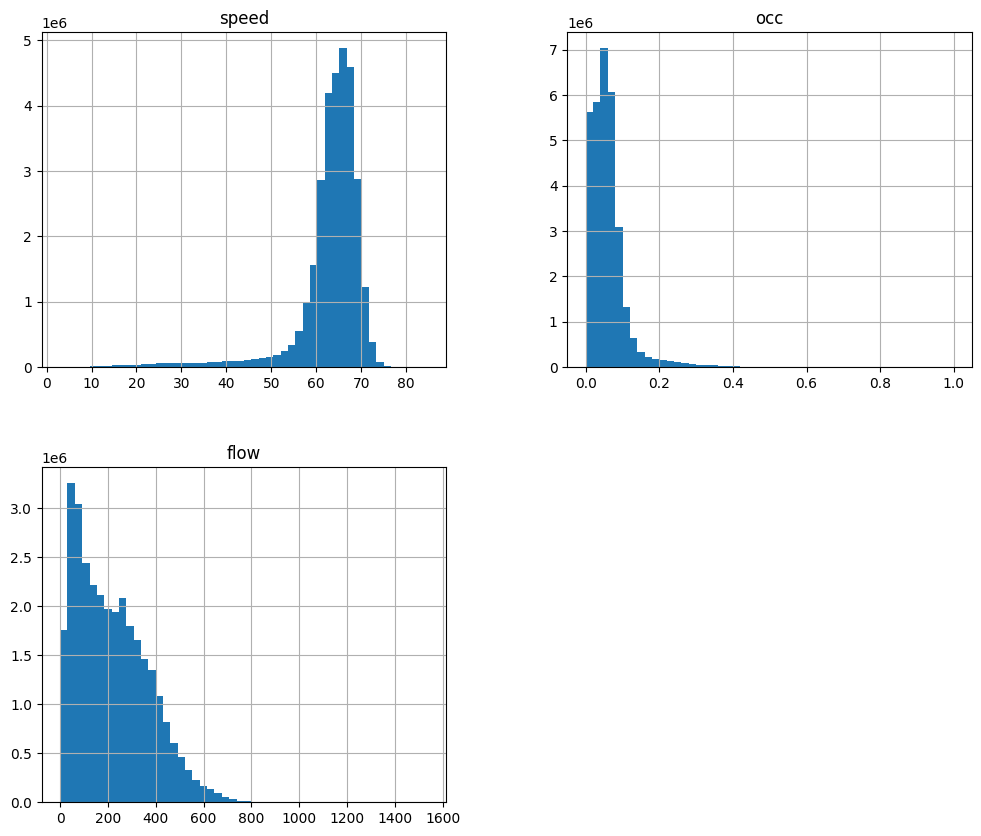

In [ ]:
traffic_data[['speed','occ','flow']].hist(bins=50, figsize=(12,10))

### Study the Correlation


In [ ]:
pd.DataFrame(traffic_data.corr(numeric_only = True))

,speed,occ,flow,station_id,month,day,hour,minute,dayofweek
speed,1.000000,-0.833530,-0.356677,4.520280e-02,-2.287442e-02,1.376415e-02,-9.003534e-02,-2.323483e-03,8.686761e-02
occ,-0.833530,1.000000,0.614796,-1.030276e-01,2.688689e-02,-8.070328e-03,2.108776e-01,1.113473e-02,-9.598956e-02
flow,-0.356677,0.614796,1.000000,-1.139813e-01,2.003783e-02,-3.968088e-03,2.904720e-01,1.144997e-02,-7.099954e-02
station_id,0.045203,-0.103028,-0.113981,1.000000e+00,4.728978e-05,3.191763e-05,1.408203e-14,7.385815e-15,5.452514e-05
month,-0.022874,0.026887,0.020038,4.728978e-05,1.000000e+00,-2.643826e-03,1.854150e-16,5.535454e-17,-1.335313e-02
day,0.013764,-0.008070,-0.003968,3.191763e-05,-2.643826e-03,1.000000e+00,3.610669e-17,1.160019e-17,-7.452610e-03
hour,-0.090035,0.210878,0.290472,1.408203e-14,1.854150e-16,3.610669e-17,1.000000e+00,1.112953e-18,1.362574e-17
minute,-0.002323,0.011135,0.011450,7.385815e-15,5.535454e-17,1.160019e-17,1.112953e-18,1.000000e+00,-4.656982e-18
dayofweek,0.086868,-0.095990,-0.071000,5.452514e-05,-1.335313e-02,-7.452610e-03,1.362574e-17,-4.656982e-18,1.000000e+00


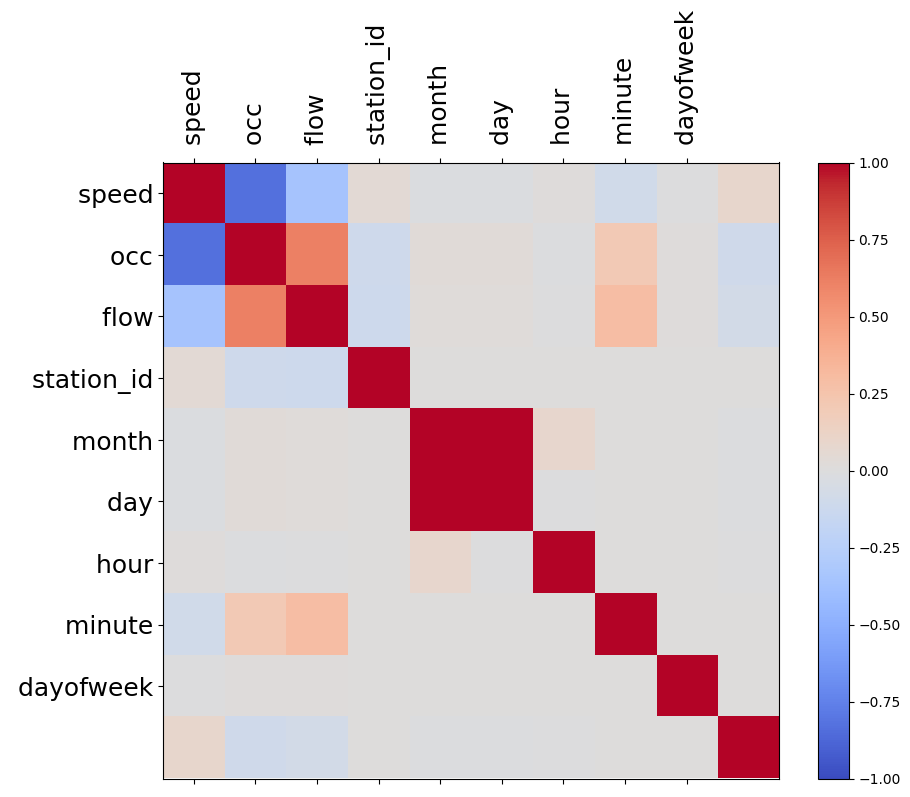

In [ ]:
x = traffic_data
alpha = x.corr(numeric_only = True).columns
plt.rcParams["axes.grid"] = False
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111)
cax = ax.matshow(x.corr(method='pearson'), cmap=plt.cm.coolwarm, vmin=-1, vmax=1)
fig.colorbar(cax)
plt.xticks(rotation='vertical')
ax.set_xticks(np.arange(len(alpha)))
ax.set_yticks(np.arange(len(alpha)))
ax.set_xticklabels([' ']+alpha)
ax.set_yticklabels([' ']+alpha)
ax.tick_params(labelsize = 18)

### Different Analysis of the Data Using Time Series Plots

In [ ]:
speed_average=traffic_data.groupby(['timestamp'])['speed'].mean().reset_index()
fig = px.line(speed_average, x="timestamp", y="speed", title='speed average over the year')
fig.show()

In [ ]:
occ_average=traffic_data.groupby(['timestamp'])['occ'].mean().reset_index()
fig = px.line(occ_average, x="timestamp", y="occ", title='occ average over the year')
fig.show()

In [ ]:
flow_average=traffic_data.groupby(['timestamp'])['flow'].mean().reset_index()
fig = px.line(flow_average, x="timestamp", y="flow", title='flow average over the year')
fig.show()

In [ ]:
speed_average=traffic_data.groupby(['month'])['speed'].mean().reset_index()
fig = px.line(speed_average, x="month", y="speed", title='speed average over the months')
fig.show()

In [ ]:
occ_average=traffic_data.groupby(['month'])['occ'].mean().reset_index()
fig = px.line(occ_average, x="month", y="occ", title='occ average over the months')
fig.show()

In [ ]:
flow_average=traffic_data.groupby(['month'])['flow'].mean().reset_index()
fig = px.line(flow_average, x="month", y="flow", title='flow average over the months')
fig.show()

### Task1: Similarly, use the next three cells to plot the speed, flow, and occupancy average over the days

In [ ]:
speed_average=traffic_data.groupby(['day'])['speed'].mean().reset_index()
fig = px.line(speed_average, x="day", y="speed", title='speed average over the days')
fig.show()

In [ ]:
speed_average=traffic_data.groupby(['day'])['flow'].mean().reset_index()
fig = px.line(speed_average, x="day", y="flow", title='flow average over the days')
fig.show()

In [ ]:
speed_average=traffic_data.groupby(['day'])['occ'].mean().reset_index()
fig = px.line(speed_average, x="day", y="occ", title='occurancy average over the days')
fig.show()

In [ ]:
speed_average=traffic_data.groupby(['dayofweek'])['speed'].mean().reset_index()
fig = px.line(speed_average, x="dayofweek", y="speed", title='speed average over the days of the weeks')
fig.show()

In [ ]:
occ_average=traffic_data.groupby(['dayofweek'])['occ'].mean().reset_index()
fig = px.line(occ_average, x="dayofweek", y="occ", title='occ average over the days of the weeks')
fig.show()

In [ ]:
flow_average=traffic_data.groupby(['dayofweek'])['flow'].mean().reset_index()
fig = px.line(flow_average, x="dayofweek", y="flow", title='flow average over the days of the weeks')
fig.show()

In [ ]:
speed_average=traffic_data.groupby(['hour'])['speed'].mean().reset_index()
fig = px.line(speed_average, x="hour", y="speed", title='speed average over the hours')
fig.show()

In [ ]:
occ_average=traffic_data.groupby(['hour'])['occ'].mean().reset_index()
fig = px.line(occ_average, x="hour", y="occ", title='occ average over the hours')
fig.show()

In [ ]:
flow_average=traffic_data.groupby(['hour'])['flow'].mean().reset_index()
fig = px.line(flow_average, x="hour", y="flow", title='flow average over the hours')
fig.show()

### Task 2: In the next cell, check if there is any missing value (i.e.: NaN) in the speed, flow, and occ features.

In [ ]:
missing_values = traffic_data[['speed', 'flow', 'occ']].isnull().sum()

print(missing_values)



speed       0
flow     7776
occ         0
dtype: int64


### Task 3: In the next cell, plot the speed time series when station_id =318484

In [ ]:
station_data = traffic_data[traffic_data['station_id'] == 318484]
fig = px.line(station_data, x="timestamp", y="speed", title='Speed Time Series for Station ID 318484')
fig.show()

# Incidents Data preprocessing and exploaration

In [ ]:
pd.set_option('display.max_columns', None)
incident

,Unnamed: 0,incident_id,cc_code,timestamp,description,latitude,longitude,district,freeway_nmbr,freeway_direction,state_postmile,abs_postmile,duration,up_id,up_lanes,up_distance,up_latitude,up_longitude,down_id,down_lanes,down_distance,down_latitude,down_longitude,active_onramp,active_offramp
0,0,16175990,SAHB,2016-01-01 16:30:00,1179-Trfc Collision-1141 Enrt,38.280275,-121.456931,3.0,5,N,NaN,497.1,70.0,317393,2,-1.607,38.257363,-121.448669,319227,2,0.101,38.281219,-121.457043,False,False
1,1,16177033,SAHB,2016-01-02 13:25:00,1183-Trfc Collision-Unkn Inj,39.314110,-120.447967,3.0,80,W,NaN,170.6,60.0,317798,2,3.203,39.325458,-120.392564,319430,2,-5.605,39.310097,-120.544000,True,True
2,2,16177599,SAHB,2016-01-02 19:00:00,1182-Trfc Collision-No Inj,38.603209,-121.435469,3.0,51,S,NaN,4.0,40.0,318540,4,0.196,38.605475,-121.433198,314157,4,-0.271,38.600753,-121.438775,True,True
3,3,16182414,SAHB,2016-01-08 07:45:00,1179-Trfc Collision-1141 Enrt,38.343525,-121.335578,3.0,99,N,NaN,281.8,45.0,317652,2,-0.730,38.333162,-121.330741,317660,2,0.730,38.352842,-121.340605,False,False
4,4,16183558,SAHB,2016-01-08 17:10:00,1182-Trfc Collision-No Inj,38.560374,-121.481408,3.0,50,E,NaN,5.2,80.0,312139,5,-0.477,38.562532,-121.489560,318282,4,0.122,38.559773,-121.479137,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,447,16907027,SAHB,2016-12-26 13:05:00,1179-Trfc Collision-1141 Enrt,38.758050,-121.261450,3.0,80,E,3.087,104.6,65.0,318801,4,-0.126,38.756912,-121.262242,318844,4,0.070,38.759443,-121.260582,False,False
448,448,16908065,SAHB,2016-12-27 05:50:00,1179-Trfc Collision-1141 Enrt,38.249222,-121.290476,3.0,99,S,0.355,274.8,50.0,319100,2,0.350,38.253209,-121.292972,317640,2,-0.134,38.246918,-121.288935,False,False
449,449,16908856,SAHB,2016-12-27 14:15:00,1179-Trfc Collision-1141 Enrt,38.651912,-121.370190,3.0,80,W,R11.462,95.1,50.0,313368,6,0.200,38.653680,-121.368403,314165,2,-0.895,38.645422,-121.384400,False,False
450,450,16911088,SAHB,2016-12-28 18:05:00,1183-Trfc Collision-Unkn Inj,38.596708,-121.549171,3.0,80,W,R11.6,83.8,75.0,319142,3,0.477,38.603117,-121.544779,317885,3,-0.613,38.589094,-121.554290,False,False


In [ ]:
incident["cc_code"].value_counts()

,count
cc_code,
SAHB,452


In [ ]:
incident["description"].value_counts()

,count
description,
1183-Trfc Collision-Unkn Inj,157
1179-Trfc Collision-1141 Enrt,132
1182-Trfc Collision-No Inj,115
1179-Trfc Collision-1141Enrt,27
20002-Hit and Run No Injuries,13
20001-Hit and Run w/Injuries,5
1181-Trfc Collision-Minor Inj,3


In [ ]:
incident["district"].value_counts()

,count
district,
3.0,452


In [ ]:
incident["freeway_nmbr"].value_counts()

,count
freeway_nmbr,
50,120
80,108
99,94
51,67
5,62
70,1


In [ ]:
incident = incident.drop('cc_code', axis=1)
incident = incident.drop('district', axis=1)


### Task4: In the next cell, plot the histograms for each of: freeway_nmbr, duration , up_distance, down_distance

array([[<Axes: title={'center': 'freeway_nmbr'}>,
        <Axes: title={'center': 'duration'}>],
       [<Axes: title={'center': 'up_distance'}>,
        <Axes: title={'center': 'down_distance'}>]], dtype=object)

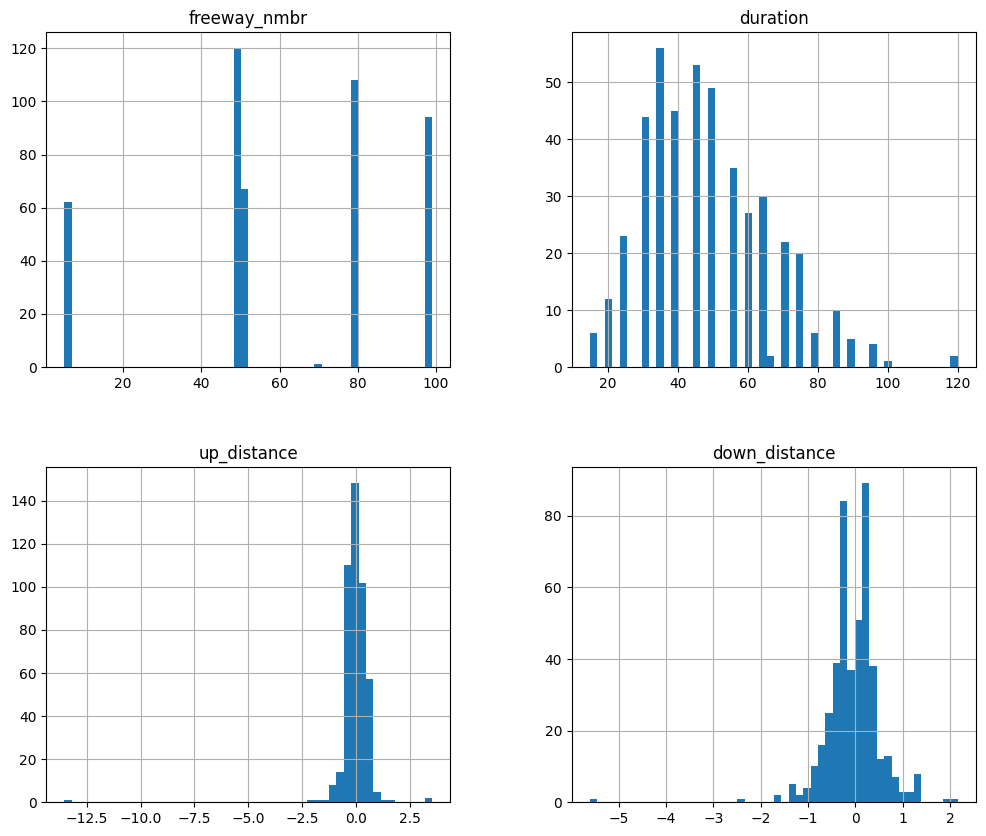

In [ ]:
incident[['freeway_nmbr', 'duration' , 'up_distance', 'down_distance']].hist(bins=50, figsize=(12,10))

In [ ]:
incident["timestamp"] = pd.to_datetime(incident["timestamp"])
incident['month'] = incident['timestamp'].dt.month
incident['day'] = incident['timestamp'].dt.day
incident['hour'] = incident['timestamp'].dt.hour
incident['minute'] = incident['timestamp'].dt.minute
incident['dayofweek'] = incident['timestamp'].dt.dayofweek
incident

,Unnamed: 0,incident_id,timestamp,description,latitude,longitude,freeway_nmbr,freeway_direction,state_postmile,abs_postmile,duration,up_id,up_lanes,up_distance,up_latitude,up_longitude,down_id,down_lanes,down_distance,down_latitude,down_longitude,active_onramp,active_offramp,month,day,hour,minute,dayofweek
0,0,16175990,2016-01-01 16:30:00,1179-Trfc Collision-1141 Enrt,38.280275,-121.456931,5,N,NaN,497.1,70.0,317393,2,-1.607,38.257363,-121.448669,319227,2,0.101,38.281219,-121.457043,False,False,1,1,16,30,4
1,1,16177033,2016-01-02 13:25:00,1183-Trfc Collision-Unkn Inj,39.314110,-120.447967,80,W,NaN,170.6,60.0,317798,2,3.203,39.325458,-120.392564,319430,2,-5.605,39.310097,-120.544000,True,True,1,2,13,25,5
2,2,16177599,2016-01-02 19:00:00,1182-Trfc Collision-No Inj,38.603209,-121.435469,51,S,NaN,4.0,40.0,318540,4,0.196,38.605475,-121.433198,314157,4,-0.271,38.600753,-121.438775,True,True,1,2,19,0,5
3,3,16182414,2016-01-08 07:45:00,1179-Trfc Collision-1141 Enrt,38.343525,-121.335578,99,N,NaN,281.8,45.0,317652,2,-0.730,38.333162,-121.330741,317660,2,0.730,38.352842,-121.340605,False,False,1,8,7,45,4
4,4,16183558,2016-01-08 17:10:00,1182-Trfc Collision-No Inj,38.560374,-121.481408,50,E,NaN,5.2,80.0,312139,5,-0.477,38.562532,-121.489560,318282,4,0.122,38.559773,-121.479137,True,False,1,8,17,10,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,447,16907027,2016-12-26 13:05:00,1179-Trfc Collision-1141 Enrt,38.758050,-121.261450,80,E,3.087,104.6,65.0,318801,4,-0.126,38.756912,-121.262242,318844,4,0.070,38.759443,-121.260582,False,False,12,26,13,5,0
448,448,16908065,2016-12-27 05:50:00,1179-Trfc Collision-1141 Enrt,38.249222,-121.290476,99,S,0.355,274.8,50.0,319100,2,0.350,38.253209,-121.292972,317640,2,-0.134,38.246918,-121.288935,False,False,12,27,5,50,1
449,449,16908856,2016-12-27 14:15:00,1179-Trfc Collision-1141 Enrt,38.651912,-121.370190,80,W,R11.462,95.1,50.0,313368,6,0.200,38.653680,-121.368403,314165,2,-0.895,38.645422,-121.384400,False,False,12,27,14,15,1
450,450,16911088,2016-12-28 18:05:00,1183-Trfc Collision-Unkn Inj,38.596708,-121.549171,80,W,R11.6,83.8,75.0,319142,3,0.477,38.603117,-121.544779,317885,3,-0.613,38.589094,-121.554290,False,False,12,28,18,5,2


### Task5: In the next 2 cells, find and plot the correlation matrix for the incident dataset.

In [ ]:
pd.DataFrame(incident.corr(numeric_only = True))

,Unnamed: 0,incident_id,latitude,longitude,freeway_nmbr,abs_postmile,duration,up_id,up_lanes,up_distance,up_latitude,up_longitude,down_id,down_lanes,down_distance,down_latitude,down_longitude,active_onramp,active_offramp,month,day,hour,minute,dayofweek
Unnamed: 0,1.000000,0.991184,0.019992,0.049201,-0.019249,-0.075416,0.001708,0.000149,-0.065227,-0.092032,0.016866,0.044262,-0.065536,-0.001636,0.035004,0.020234,0.049465,0.008294,-0.003925,0.986763,-0.005434,-0.003764,0.004641,-0.031598
incident_id,0.991184,1.000000,0.005291,0.029955,-0.024169,-0.053442,0.007865,0.000639,-0.071510,-0.079250,0.002742,0.025553,-0.068550,0.000704,0.035485,0.005369,0.029980,0.006088,0.005656,0.996783,-0.006850,-0.013192,0.013749,-0.034462
latitude,0.019992,0.005291,1.000000,0.641759,-0.006207,-0.212642,-0.052247,0.068371,-0.009058,-0.142990,0.998870,0.641225,0.132276,-0.038843,-0.195969,0.999018,0.638420,-0.080405,-0.019094,0.005923,-0.018908,0.055425,-0.034696,0.011833
longitude,0.049201,0.029955,0.641759,1.000000,0.215444,-0.258189,-0.078920,0.064044,-0.151049,-0.211446,0.635206,0.997315,0.087641,-0.145418,-0.156472,0.642907,0.998715,-0.076415,-0.050468,0.032036,-0.064018,0.057722,-0.062409,0.044913
freeway_nmbr,-0.019249,-0.024169,-0.006207,0.215444,1.000000,-0.249150,-0.026354,-0.023990,-0.134297,-0.004979,-0.006108,0.215393,-0.023385,-0.150008,0.009705,-0.005957,0.217062,-0.127247,-0.002365,-0.025756,0.009331,0.017431,0.026932,0.048870
abs_postmile,-0.075416,-0.053442,-0.212642,-0.258189,-0.249150,1.000000,-0.001146,0.348195,-0.116059,0.005788,-0.215847,-0.262854,0.226456,-0.080076,-0.026765,-0.210557,-0.261083,0.212390,-0.011281,-0.052916,0.021541,-0.057447,0.034901,-0.077207
duration,0.001708,0.007865,-0.052247,-0.078920,-0.026354,-0.001146,1.000000,0.065363,-0.027983,0.053960,-0.050554,-0.075911,0.038749,-0.070414,-0.148850,-0.056449,-0.085827,-0.008837,-0.026997,-0.000979,0.089053,-0.046779,0.035625,0.077946
up_id,0.000149,0.000639,0.068371,0.064044,-0.023990,0.348195,0.065363,1.000000,-0.119903,0.042694,0.065350,0.066342,0.252781,-0.157956,-0.044276,0.072337,0.065757,-0.005325,-0.107100,-0.000303,0.025725,0.040471,0.004418,-0.003339
up_lanes,-0.065227,-0.071510,-0.009058,-0.151049,-0.134297,-0.116059,-0.027983,-0.119903,1.000000,0.089994,-0.005824,-0.145065,0.003435,0.471845,0.011152,-0.006025,-0.157553,0.009064,0.108745,-0.072546,-0.003718,-0.073666,-0.021027,-0.047234
up_distance,-0.092032,-0.079250,-0.142990,-0.211446,-0.004979,0.005788,0.053960,0.042694,0.089994,1.000000,-0.106017,-0.148523,0.058865,0.016403,-0.488098,-0.162272,-0.225925,0.150738,0.119498,-0.079079,0.004285,-0.064839,-0.130256,-0.015562


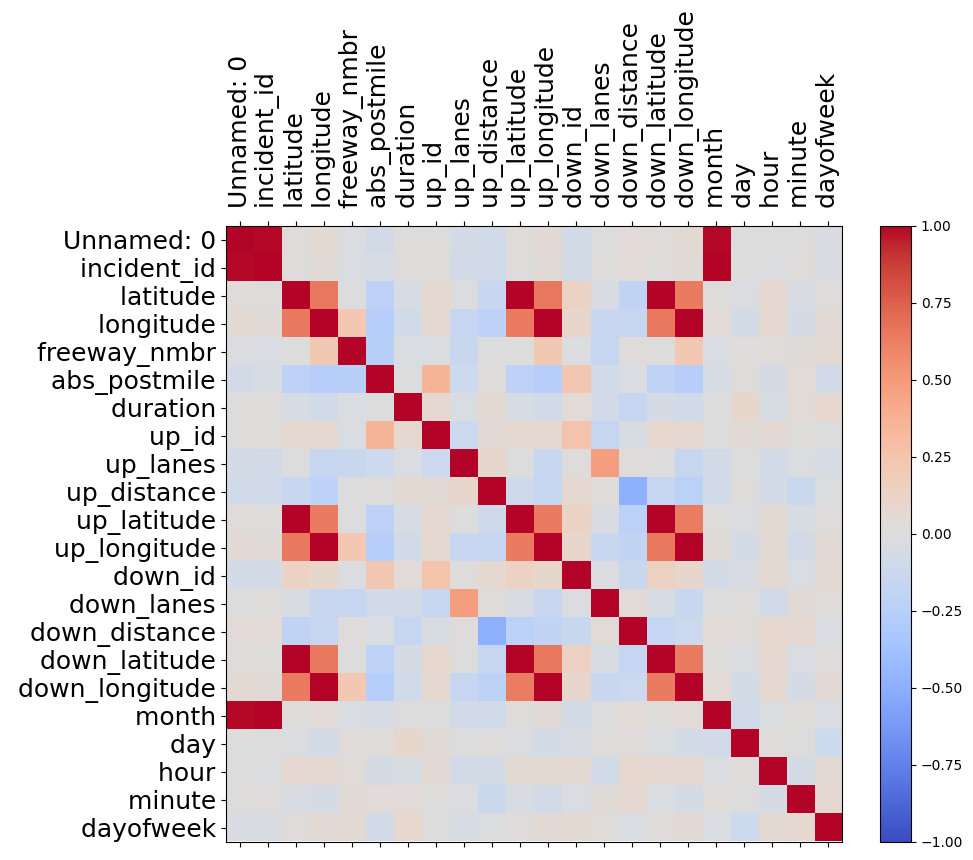

In [ ]:
x = incident.select_dtypes(include=['number'])
alpha = x.corr(numeric_only = True).columns
plt.rcParams["axes.grid"] = False
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111)
cax = ax.matshow(x.corr(method='pearson'), cmap=plt.cm.coolwarm, vmin=-1, vmax=1)
fig.colorbar(cax)
plt.xticks(rotation='vertical')
ax.set_xticks(np.arange(len(alpha)))
ax.set_yticks(np.arange(len(alpha)))
ax.set_xticklabels([' ']+alpha)
ax.set_yticklabels([' ']+alpha)
ax.tick_params(labelsize = 18)

# Merged data

# Study and Analysis of Three Months Period

We will consider each available checkpoint as a down checkpoint. If an accident occurs, the rest of the data will be filled out, otherwise it will appear as a NaN.

In [ ]:
traffic_data = pd.read_parquet("/content/drive/MyDrive/traffic_data.parquet")
incident = pd.read_csv("/content/drive/MyDrive/incidents.csv")
traffic_data["timestamp"] = pd.to_datetime(traffic_data["timestamp"])
traffic_data['quarter'] = traffic_data['timestamp'].dt.to_period('Q')
incident["timestamp"] = pd.to_datetime(incident["timestamp"])
incident['quarter'] = incident['timestamp'].dt.to_period('Q')
incident = incident.drop('cc_code', axis=1)
incident = incident.drop('district', axis=1)
incident = incident.drop('Unnamed: 0', axis=1)
incident = incident.drop('incident_id', axis=1)



In [ ]:
traffic_data

,speed,occ,flow,station_id,timestamp,quarter
0,67.7,0.0373,105.0,318484,2016-01-01 00:00:00,2016Q1
1,66.9,0.0421,125.0,318484,2016-01-01 00:05:00,2016Q1
2,67.1,0.0399,125.0,318484,2016-01-01 00:10:00,2016Q1
3,66.8,0.0438,140.0,318484,2016-01-01 00:15:00,2016Q1
4,66.9,0.0461,160.0,318484,2016-01-01 00:20:00,2016Q1
...,...,...,...,...,...,...
31138267,69.0,0.0159,103.0,316414,2016-12-31 23:35:00,2016Q4
31138268,68.8,0.0157,103.0,316414,2016-12-31 23:40:00,2016Q4
31138269,69.5,0.0140,94.0,316414,2016-12-31 23:45:00,2016Q4
31138270,68.9,0.0159,102.0,316414,2016-12-31 23:50:00,2016Q4


In [ ]:
incident

,timestamp,description,latitude,longitude,freeway_nmbr,freeway_direction,state_postmile,abs_postmile,duration,up_id,up_lanes,up_distance,up_latitude,up_longitude,down_id,down_lanes,down_distance,down_latitude,down_longitude,active_onramp,active_offramp,quarter
0,2016-01-01 16:30:00,1179-Trfc Collision-1141 Enrt,38.280275,-121.456931,5,N,NaN,497.1,70.0,317393,2,-1.607,38.257363,-121.448669,319227,2,0.101,38.281219,-121.457043,False,False,2016Q1
1,2016-01-02 13:25:00,1183-Trfc Collision-Unkn Inj,39.314110,-120.447967,80,W,NaN,170.6,60.0,317798,2,3.203,39.325458,-120.392564,319430,2,-5.605,39.310097,-120.544000,True,True,2016Q1
2,2016-01-02 19:00:00,1182-Trfc Collision-No Inj,38.603209,-121.435469,51,S,NaN,4.0,40.0,318540,4,0.196,38.605475,-121.433198,314157,4,-0.271,38.600753,-121.438775,True,True,2016Q1
3,2016-01-08 07:45:00,1179-Trfc Collision-1141 Enrt,38.343525,-121.335578,99,N,NaN,281.8,45.0,317652,2,-0.730,38.333162,-121.330741,317660,2,0.730,38.352842,-121.340605,False,False,2016Q1
4,2016-01-08 17:10:00,1182-Trfc Collision-No Inj,38.560374,-121.481408,50,E,NaN,5.2,80.0,312139,5,-0.477,38.562532,-121.489560,318282,4,0.122,38.559773,-121.479137,True,False,2016Q1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,2016-12-26 13:05:00,1179-Trfc Collision-1141 Enrt,38.758050,-121.261450,80,E,3.087,104.6,65.0,318801,4,-0.126,38.756912,-121.262242,318844,4,0.070,38.759443,-121.260582,False,False,2016Q4
448,2016-12-27 05:50:00,1179-Trfc Collision-1141 Enrt,38.249222,-121.290476,99,S,0.355,274.8,50.0,319100,2,0.350,38.253209,-121.292972,317640,2,-0.134,38.246918,-121.288935,False,False,2016Q4
449,2016-12-27 14:15:00,1179-Trfc Collision-1141 Enrt,38.651912,-121.370190,80,W,R11.462,95.1,50.0,313368,6,0.200,38.653680,-121.368403,314165,2,-0.895,38.645422,-121.384400,False,False,2016Q4
450,2016-12-28 18:05:00,1183-Trfc Collision-Unkn Inj,38.596708,-121.549171,80,W,R11.6,83.8,75.0,319142,3,0.477,38.603117,-121.544779,317885,3,-0.613,38.589094,-121.554290,False,False,2016Q4


In [ ]:
traffic_1_quarter = traffic_data[traffic_data['quarter'] == "2016Q1"]
incident_1_quarter = incident[incident['quarter'] == "2016Q1"]
x=traffic_1_quarter.rename(columns={"station_id": "down_id"})
x=x.rename(columns={"speed": "down_speed"})
x=x.rename(columns={"occ": "down_occ"})
x=x.rename(columns={"flow": "down_flow"})
merged = pd.merge(x, incident_1_quarter, how="left", on=["timestamp","down_id"])
merged


,down_speed,down_occ,down_flow,down_id,timestamp,quarter_x,description,latitude,longitude,freeway_nmbr,freeway_direction,state_postmile,abs_postmile,duration,up_id,up_lanes,up_distance,up_latitude,up_longitude,down_lanes,down_distance,down_latitude,down_longitude,active_onramp,active_offramp,quarter_y
0,67.7,0.0373,105.0,318484,2016-01-01 00:00:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
1,66.9,0.0421,125.0,318484,2016-01-01 00:05:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
2,67.1,0.0399,125.0,318484,2016-01-01 00:10:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
3,66.8,0.0438,140.0,318484,2016-01-01 00:15:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
4,66.9,0.0461,160.0,318484,2016-01-01 00:20:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7615876,69.0,0.0209,117.0,316414,2016-03-31 23:35:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
7615877,67.3,0.0221,113.0,316414,2016-03-31 23:40:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
7615878,67.3,0.0169,89.0,316414,2016-03-31 23:45:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
7615879,66.7,0.0217,96.0,316414,2016-03-31 23:50:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT


In [ ]:
x=traffic_1_quarter.rename(columns={"station_id": "up_id"})
x=x.rename(columns={"speed": "up_speed"})
x=x.rename(columns={"occ": "up_occ"})
x=x.rename(columns={"flow": "up_flow"})
merged = pd.merge(merged, x, how="left", on=["timestamp","up_id"])
merged

,down_speed,down_occ,down_flow,down_id,timestamp,quarter_x,description,latitude,longitude,freeway_nmbr,freeway_direction,state_postmile,abs_postmile,duration,up_id,up_lanes,up_distance,up_latitude,up_longitude,down_lanes,down_distance,down_latitude,down_longitude,active_onramp,active_offramp,quarter_y,up_speed,up_occ,up_flow,quarter
0,67.7,0.0373,105.0,318484,2016-01-01 00:00:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
1,66.9,0.0421,125.0,318484,2016-01-01 00:05:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
2,67.1,0.0399,125.0,318484,2016-01-01 00:10:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
3,66.8,0.0438,140.0,318484,2016-01-01 00:15:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
4,66.9,0.0461,160.0,318484,2016-01-01 00:20:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7615876,69.0,0.0209,117.0,316414,2016-03-31 23:35:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
7615877,67.3,0.0221,113.0,316414,2016-03-31 23:40:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
7615878,67.3,0.0169,89.0,316414,2016-03-31 23:45:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
7615879,66.7,0.0217,96.0,316414,2016-03-31 23:50:00,2016Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT


In [ ]:
merged["timestamp"] = pd.to_datetime(merged["timestamp"])
merged["up_id"] = merged["up_id"].astype("category")
merged["down_id"] = merged["down_id"].astype("category")
merged['month'] = merged['timestamp'].dt.month
merged['day'] = merged['timestamp'].dt.day
merged['hour'] = merged['timestamp'].dt.hour
merged['minute'] = merged['timestamp'].dt.minute
merged['dayofweek'] = merged['timestamp'].dt.dayofweek
merged = merged.drop('quarter_x', axis=1)
merged = merged.drop('quarter_y', axis=1)
merged = merged.drop('quarter', axis=1)
merged = merged.drop('timestamp', axis=1)
merged

,down_speed,down_occ,down_flow,down_id,description,latitude,longitude,freeway_nmbr,freeway_direction,state_postmile,abs_postmile,duration,up_id,up_lanes,up_distance,up_latitude,up_longitude,down_lanes,down_distance,down_latitude,down_longitude,active_onramp,active_offramp,up_speed,up_occ,up_flow,month,day,hour,minute,dayofweek
0,67.7,0.0373,105.0,318484,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,0,4
1,66.9,0.0421,125.0,318484,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,5,4
2,67.1,0.0399,125.0,318484,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,10,4
3,66.8,0.0438,140.0,318484,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,15,4
4,66.9,0.0461,160.0,318484,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,20,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7615876,69.0,0.0209,117.0,316414,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,31,23,35,3
7615877,67.3,0.0221,113.0,316414,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,31,23,40,3
7615878,67.3,0.0169,89.0,316414,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,31,23,45,3
7615879,66.7,0.0217,96.0,316414,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,31,23,50,3


In [ ]:

merged['description'] = merged['description'].replace(['1179-Trfc Collision-1141Enrt'], '1179-Trfc Collision-1141 Enrt')
merged[["description"]].value_counts()

,count
description,
1179-Trfc Collision-1141 Enrt,31
1182-Trfc Collision-No Inj,29
1183-Trfc Collision-Unkn Inj,29
20002-Hit and Run No Injuries,3


In [ ]:
x=merged.groupby(['month', 'description']).size().to_frame().reset_index()
fig = px.bar(x, x="month", y=[0], color="description", title="accident by month")
fig.show()

In [ ]:
x=merged.groupby(['dayofweek', 'description']).size().to_frame().reset_index()
fig = px.bar(x, x="dayofweek", y=[0], color="description", title="accident by day of week")
fig.show()

In [ ]:
x=merged.groupby(['hour', 'description']).size().to_frame().reset_index()
fig = px.bar(x, x="hour", y=[0], color="description", title="accident by hour")
fig.show()

In [ ]:
merged['description'] = merged['description'].fillna("no accident")
merged['description'] = merged['description'].astype(str)
x=merged.groupby(['description']).mean(numeric_only=True).reset_index()
x

,description,down_speed,down_occ,down_flow,latitude,longitude,freeway_nmbr,abs_postmile,duration,up_lanes,up_distance,up_latitude,up_longitude,down_lanes,down_distance,down_latitude,down_longitude,up_speed,up_occ,up_flow,month,day,hour,minute,dayofweek
0,1179-Trfc Collision-1141 Enrt,55.248387,0.096197,233.193548,38.585288,-121.379995,68.451613,170.867742,49.129032,3.258065,-0.112903,38.584039,-121.381341,3.032258,0.126129,38.586693,-121.378582,43.106452,0.223313,279.483871,2.129032,17.903226,15.129032,26.612903,3.032258
1,1182-Trfc Collision-No Inj,51.744828,0.124431,345.896552,38.617897,-121.426904,52.413793,131.168966,54.827586,4.000000,0.035828,38.618471,-121.426576,3.689655,-0.117345,38.616810,-121.426794,45.468966,0.210634,431.620690,2.034483,15.724138,11.965517,24.655172,3.034483
2,1183-Trfc Collision-Unkn Inj,54.072414,0.085262,291.068966,38.611910,-121.390084,66.482759,131.734483,45.862069,3.896552,0.182793,38.612833,-121.387812,3.517241,-0.229517,38.611586,-121.393210,46.479310,0.199538,334.206897,1.620690,17.827586,13.724138,23.620690,2.448276
3,20002-Hit and Run No Injuries,50.133333,0.208433,232.666667,38.539321,-121.414511,92.666667,226.966667,46.666667,4.000000,0.171667,38.540720,-121.412458,2.666667,-0.198333,38.537835,-121.418224,52.533333,0.152767,376.666667,2.333333,12.000000,11.666667,25.000000,2.000000
4,no accident,63.243767,0.057117,210.931200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000001,15.929275,11.499976,27.500027,3.066142


In [ ]:
fig = go.Figure(data=[
    go.Bar(name='down_speed',opacity=0.8,marker_color='#4C78A8',x=x["description"], y=x["down_speed"]),
    go.Bar(name='up_speed',opacity=0.8,marker_color='#F58518',x=x["description"], y=x["up_speed"]),
  ])
fig.update_layout(
    yaxis_title="Speed",
  title={
        'text': "average speed depending on type of accident",
        'y':0.01,
        'x':0.44,

        'xanchor': 'center',
        'yanchor': 'bottom'})


fig.show()

In [ ]:
fig = go.Figure(data=[
    go.Bar(name='down_occ',opacity=0.8,marker_color='#4C78A8',x=x["description"], y=x["down_occ"]),
    go.Bar(name='up_occ',opacity=0.8,marker_color='#F58518',x=x["description"], y=x["up_occ"]),
  ])
fig.update_layout(
    yaxis_title="Occupancy",
  title={
        'text': "average occupancy depending on type of accident",
        'y':0.01,
        'x':0.44,
        'xanchor': 'center',
        'yanchor': 'bottom'})


fig.show()

In [ ]:
fig = go.Figure(data=[
    go.Bar(name='down_flow',opacity=0.8,marker_color='#4C78A8',x=x["description"], y=x["down_flow"]),
    go.Bar(name='up_flow',opacity=0.8,marker_color='#F58518',x=x["description"], y=x["up_flow"]),
  ])
fig.update_layout(
    yaxis_title="Flow",
  title={
        'text': "average flow depending on type of accident",
        'y':0.01,
        'x':0.44,
        'xanchor': 'center',
        'yanchor': 'bottom'})


fig.show()

In [ ]:
fig = go.Figure(data=[
    go.Bar(name='duration',opacity=0.8,marker_color='#4C78A8',x=x["description"], y=x["duration"])
  ])
fig.update_layout(
    yaxis_title="Time (min)",
  title={
        'text': "average duration depending on type of accident",
        'y':0.01,
        'x':0.44,
        'xanchor': 'center',
        'yanchor': 'bottom'})


fig.show()

#1.Use the "traffic_data.parquet" file to read the traffic data into pandas dataframe
#2.Choose 1 sensor and plot it's speed and flow data (line plots)
#3.apply exponential smoothing filter to each feature
#4.plot the data again (line plots)
#5.Explore time series forecasting models, choose one model, and start to apply it on this speed and flow data

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.layers import GRU, Dense
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from sklearn.metrics import mean_squared_error




In [8]:
traffic_data = pd.read_parquet("/content/drive/MyDrive/traffic_data.parquet")
traffic_data.head()

,speed,occ,flow,station_id,timestamp
0,67.7,0.0373,105.0,318484,2016-01-01 00:00:00
1,66.9,0.0421,125.0,318484,2016-01-01 00:05:00
2,67.1,0.0399,125.0,318484,2016-01-01 00:10:00
3,66.8,0.0438,140.0,318484,2016-01-01 00:15:00
4,66.9,0.0461,160.0,318484,2016-01-01 00:20:00


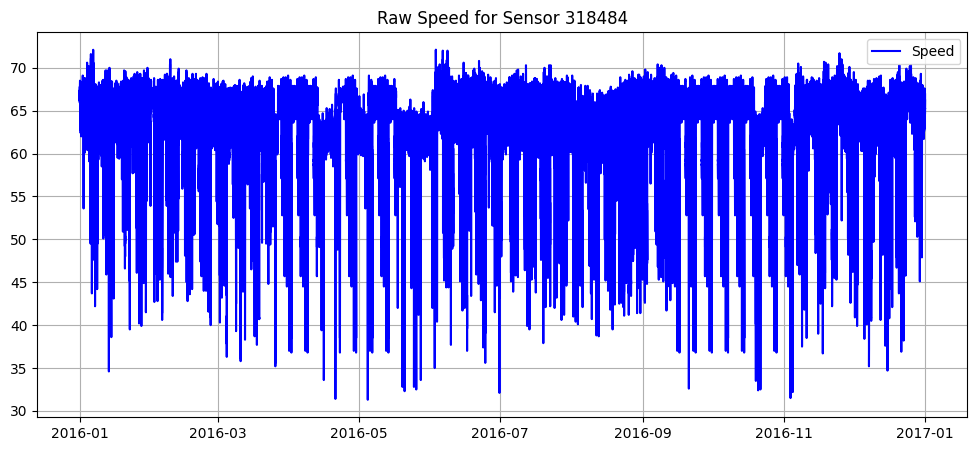

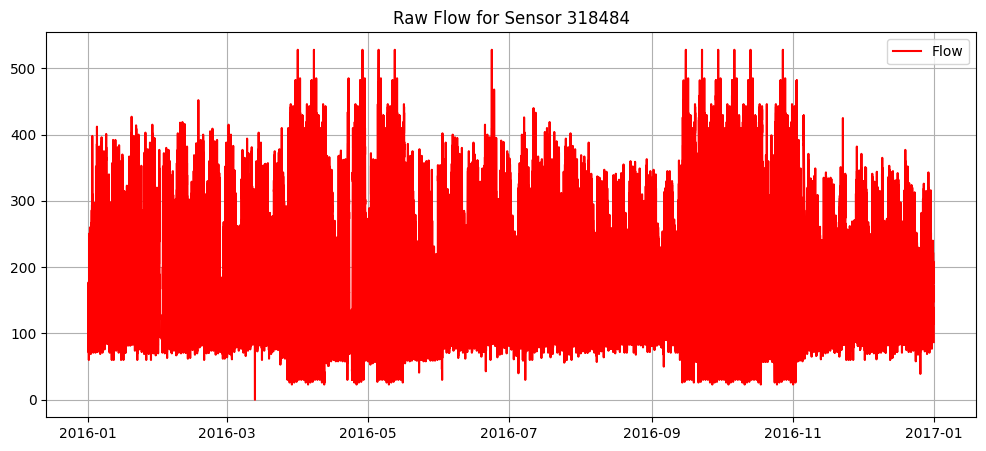

In [9]:
sensor_id = traffic_data['station_id'].iloc[0]
sensor = traffic_data[traffic_data['station_id'] == sensor_id].copy()

sensor['timestamp'] = pd.to_datetime(sensor['timestamp'])
sensor = sensor.sort_values('timestamp')

plt.figure(figsize=(12,5))
plt.plot(sensor['timestamp'], sensor['speed'], color='blue', label="Speed")
plt.title(f"Raw Speed for Sensor {sensor_id}")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(12,5))
plt.plot(sensor['timestamp'], sensor['flow'], color='red', label="Flow")
plt.title(f"Raw Flow for Sensor {sensor_id}")
plt.legend()
plt.grid(True)
plt.show()

In [10]:
sensor['speed_smooth'] = sensor['speed'].ewm(alpha=0.05).mean()
sensor['flow_smooth'] = sensor['flow'].ewm(alpha=0.05).mean()

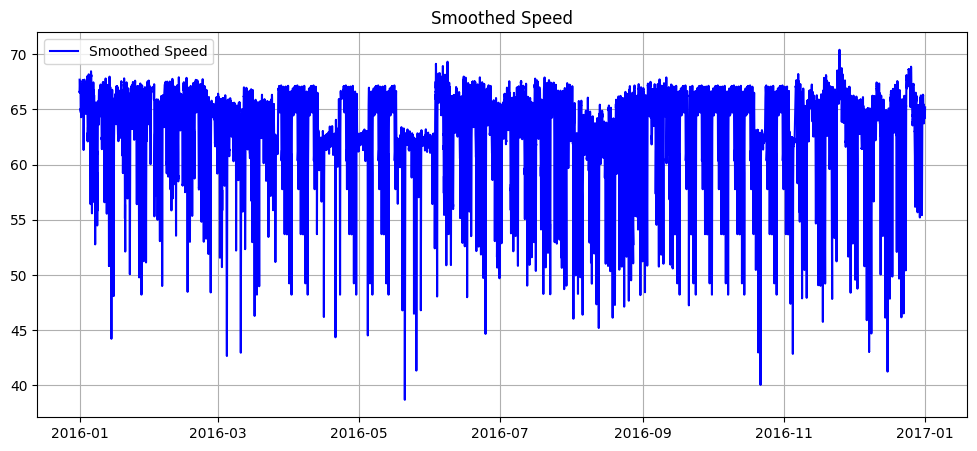

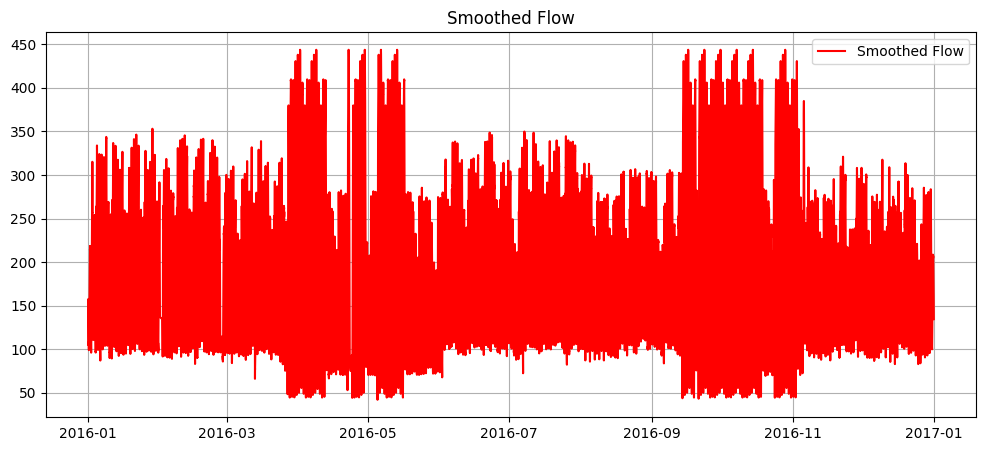

In [11]:
plt.figure(figsize=(12,5))
plt.plot(sensor['timestamp'], sensor['speed_smooth'], color='blue', label="Smoothed Speed")
plt.legend()
plt.title("Smoothed Speed")
plt.grid(True)
plt.show()

plt.figure(figsize=(12,5))
plt.plot(sensor['timestamp'], sensor['flow_smooth'], color='red', label="Smoothed Flow")
plt.legend()
plt.title("Smoothed Flow")
plt.grid(True)
plt.show()

SimpleExpSmoothing

In [12]:


def fit_and_forecast(series, train_ratio=0.8):

    n = len(series)
    train_size = int(n * train_ratio)

    train = series.iloc[:train_size]
    test  = series.iloc[train_size:]

    model = SimpleExpSmoothing(train).fit(optimized=True)
    forecast = model.forecast(len(test))

    return train, test, forecast



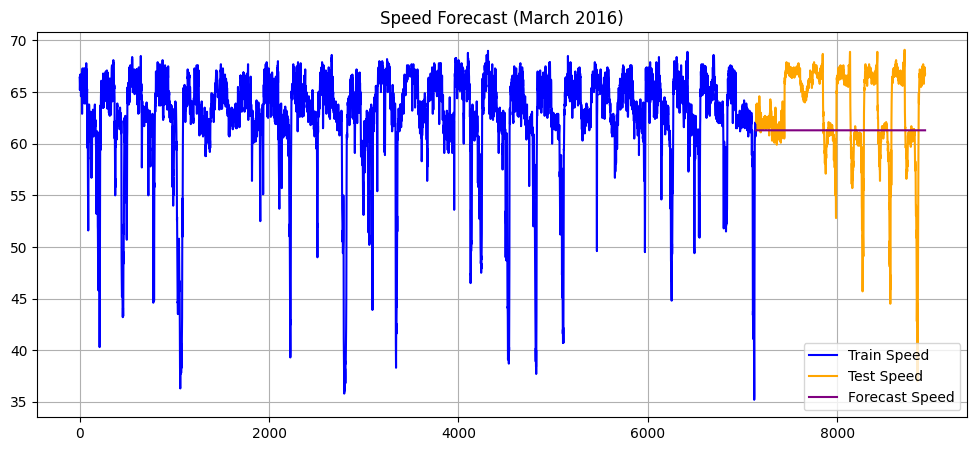

In [16]:
speed_series = one_month['speed'].reset_index(drop=True)

train_s, test_s, forecast_s = fit_and_forecast(speed_series)

plt.figure(figsize=(12,5))
plt.plot(train_s, label="Train Speed", color='blue')
plt.plot(test_s.index, test_s, label="Test Speed", color='orange')
plt.plot(test_s.index, forecast_s, label="Forecast Speed", color='purple')
plt.title("Speed Forecast (March 2016)")
plt.legend()
plt.grid(True)
plt.show()



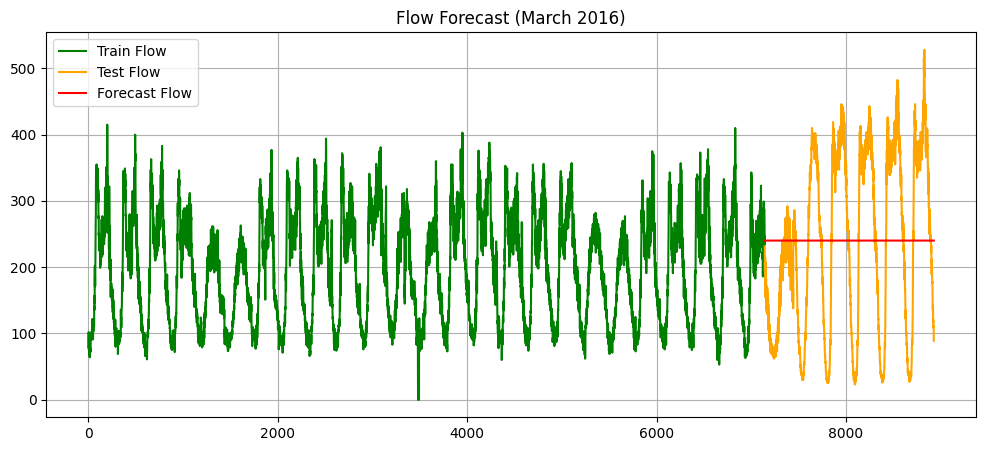

In [17]:
flow_series = one_month['flow'].reset_index(drop=True)

train_f, test_f, forecast_f = fit_and_forecast(flow_series)

plt.figure(figsize=(12,5))
plt.plot(train_f, label="Train Flow", color='green')
plt.plot(test_f.index, test_f, label="Test Flow", color='orange')
plt.plot(test_f.index, forecast_f, label="Forecast Flow", color='red')
plt.title("Flow Forecast (March 2016)")
plt.legend()
plt.grid(True)
plt.show()

LSTM

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_1 (LSTM)                   │ (None, 50)             │        14,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,251 (55.67 KB)

 Trainable params: 14,251 (55.67 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 22s 3ms/step - loss: 0.0090
Epoch 2/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 18s 2ms/step - loss: 0.0021
Epoch 3/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 18s 2ms/step - loss: 0.0016
Epoch 4/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 17s 2ms/step - loss: 0.0016
Epoch 5/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - loss: 0.0017
Epoch 6/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 17s 2ms/step - loss: 0.0016
Epoch 7/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - loss: 0.0015
Epoch 8/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 18s 3ms/step - loss: 0.0015
Epoch 9/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - loss: 0.0015
Epoch 10/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 18s 2ms/step - loss: 0.0016
Epoch 11/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 22s 3ms/step - loss: 0.0016
Epoch 12/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 18s 3ms/step - loss: 0.0014
Epoch 13/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 18s 2ms/step - loss: 0.0015
Epoch 14/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 18s 3ms/step - loss: 0.0014
Epoch 15/1

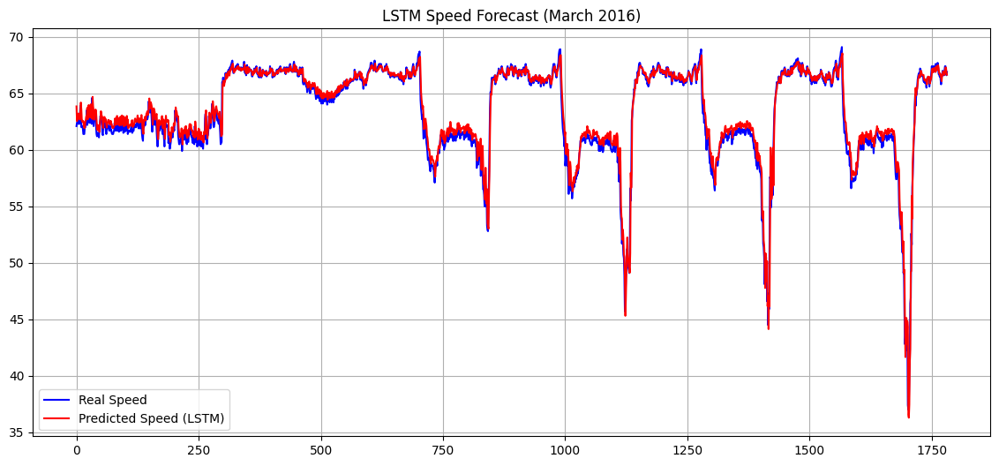

In [18]:

#speed

# 1. Select one month (March 2016)

sensor['timestamp'] = pd.to_datetime(sensor['timestamp'])
one_month = sensor[sensor['timestamp'].dt.to_period('M') == '2016-03']

speed_series = one_month['speed'].reset_index(drop=True)


# 2. Normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
speed_scaled = scaler.fit_transform(speed_series.values.reshape(-1, 1))


# 3. Create supervised dataset (look_back)

def create_dataset(dataset, look_back=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back - 1):
        a = dataset[i:(i + look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)

look_back = 20
X, y = create_dataset(speed_scaled, look_back)


# 4. Train-test split (80/20)

train_size = int(len(X) * 0.8)
test_size  = len(X) - train_size

X_train = X[:train_size]
X_test  = X[train_size:]
y_train = y[:train_size]
y_test  = y[train_size:]


# 5. Reshape input to [samples, time steps, features]

X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test  = np.reshape(X_test,  (X_test.shape[0], 1, X_test.shape[1]))


# 6. Build LSTM model

model = Sequential()
model.add(LSTM(50, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

print(model.summary())


# 7. Train the model

history = model.fit(X_train, y_train, epochs=15, batch_size=1, verbose=1)


# 8. Make predictions

trainPredict = model.predict(X_train)
testPredict  = model.predict(X_test)

# invert back to original scale
trainPredict = scaler.inverse_transform(trainPredict)
testPredict  = scaler.inverse_transform(testPredict)
y_train_real = scaler.inverse_transform([y_train])
y_test_real  = scaler.inverse_transform([y_test])


# 9. Plot results

plt.figure(figsize=(14,6))
plt.plot(y_test_real[0], label='Real Speed', color='blue')
plt.plot(testPredict[:,0], label='Predicted Speed (LSTM)', color='red')
plt.title("LSTM Speed Forecast (March 2016)")
plt.legend()
plt.grid(True)
plt.show()

Epoch 1/15


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7125/7125 ━━━━━━━━━━━━━━━━━━━━ 25s 3ms/step - loss: 0.0037
Epoch 2/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 35s 2ms/step - loss: 0.0013
Epoch 3/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step - loss: 0.0013
Epoch 4/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step - loss: 0.0013
Epoch 5/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step - loss: 0.0013
Epoch 6/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step - loss: 0.0013
Epoch 7/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step - loss: 0.0013
Epoch 8/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step - loss: 0.0011
Epoch 9/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step - loss: 0.0012
Epoch 10/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 16s 2ms/step - loss: 0.0012
Epoch 11/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 16s 2ms/step - loss: 0.0012
Epoch 12/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step - loss: 0.0012
Epoch 13/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step - loss: 0.0012
Epoch 14/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step - loss: 0.0012
Epoch 15/15
7125/7125 ━━━━

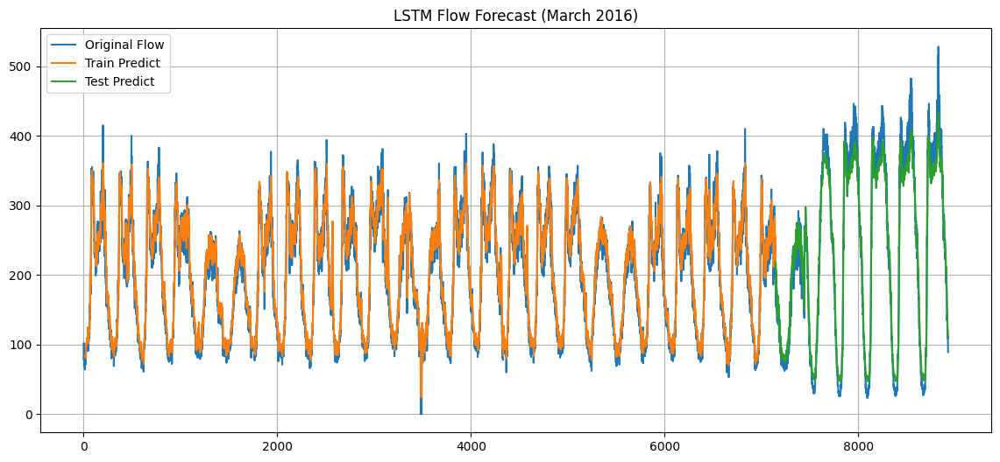

In [ ]:
#flow
# convert timestamp
sensor['timestamp'] = pd.to_datetime(sensor['timestamp'])
one_month = sensor[sensor['timestamp'].dt.to_period('M') == '2016-03']
flow_series = one_month['flow'].reset_index(drop=True)

# normalize
scaler = MinMaxScaler(feature_range=(0, 1))
flow_scaled = scaler.fit_transform(flow_series.values.reshape(-1, 1))

# create dataset (look_back = 20)
def create_dataset(dataset, look_back=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back - 1):
        a = dataset[i:(i + look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)

look_back = 20
X, y = create_dataset(flow_scaled, look_back)

# split into train and test sets (80/20)
train_size = int(len(X) * 0.8)
trainX, testX = X[:train_size], X[train_size:]
trainY, testY = y[:train_size], y[train_size:]

# reshape into [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX  = np.reshape(testX,  (testX.shape[0], 1, testX.shape[1]))

# create and fit LSTM
model = Sequential()
model.add(LSTM(50, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=15, batch_size=1, verbose=1)

# predictions
trainPredict = model.predict(trainX)
testPredict  = model.predict(testX)

# invert
trainPredict = scaler.inverse_transform(trainPredict)
testPredict  = scaler.inverse_transform(testPredict)
trainY_inv   = scaler.inverse_transform([trainY])
testY_inv    = scaler.inverse_transform([testY])


# plot
plt.figure(figsize=(14,6))
plt.plot(scaler.inverse_transform(flow_scaled), label="Original Flow")
plt.plot(trainPredictPlot, label="Train Predict")
plt.plot(testPredictPlot, label="Test Predict")
plt.title("LSTM Flow Forecast (March 2016)")
plt.legend()
plt.grid(True)
plt.show()

GRU

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru_5 (GRU)                     │ (None, 50)             │         7,950 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,001 (31.25 KB)

 Trainable params: 8,001 (31.25 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 53s 7ms/step - loss: 0.0108
Epoch 2/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 53s 7ms/step - loss: 0.0015
Epoch 3/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 107s 11ms/step - loss: 0.0013
Epoch 4/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 80s 11ms/step - loss: 0.0014
Epoch 5/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 77s 11ms/step - loss: 0.0014
Epoch 6/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 59s 8ms/step - loss: 0.0013
Epoch 7/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 55s 8ms/step - loss: 0.0014
Epoch 8/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 78s 7ms/step - loss: 0.0014
Epoch 9/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 54s 8ms/step - loss: 0.0014
Epoch 10/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 81s 7ms/step - loss: 0.0013
Epoch 11/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 51s 7ms/step - loss: 0.0013
Epoch 12/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 52s 7ms/step - loss: 0.0014
Epoch 13/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 54s 8ms/step - loss: 0.0013
Epoch 14/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 53s 7ms/step - loss: 0.0012
Epoch 

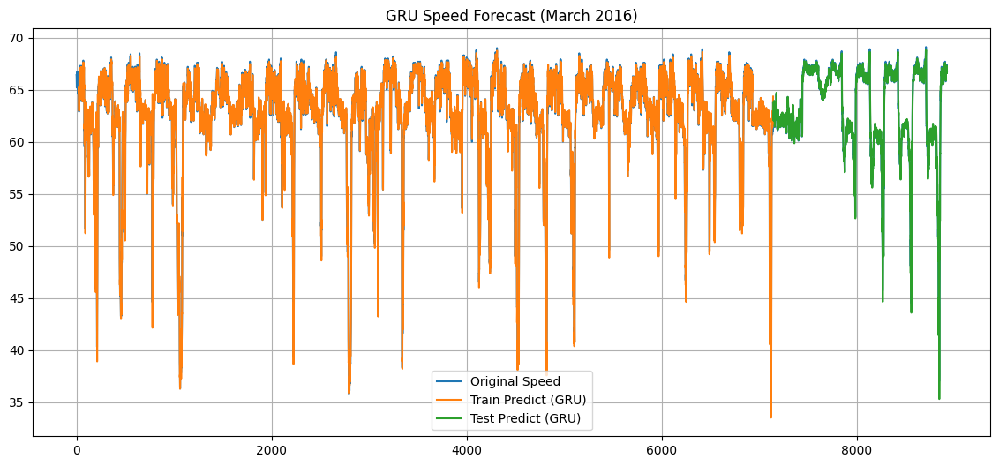

In [26]:

# speed


#  Select one month
sensor['timestamp'] = pd.to_datetime(sensor['timestamp'])
one_month = sensor[sensor['timestamp'].dt.to_period('M') == '2016-03']
speed_series = one_month['speed'].reset_index(drop=True)

#  Normalize
scaler = MinMaxScaler(feature_range=(0, 1))
speed_scaled = scaler.fit_transform(speed_series.values.reshape(-1, 1))

#  Create supervised dataset
def create_dataset(dataset, look_back=20):
    X, y = [], []
    for i in range(len(dataset) - look_back - 1):
        X.append(dataset[i:i+look_back, 0])
        y.append(dataset[i+look_back, 0])
    return np.array(X), np.array(y)

look_back = 20
X, y = create_dataset(speed_scaled, look_back)

# Train / test split (80 / 20)
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

#  Reshape to [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], look_back, 1))
X_test  = X_test.reshape((X_test.shape[0],  look_back, 1))

#  Build GRU model
model_gru = Sequential()
model_gru.add(GRU(50, input_shape=(look_back, 1)))
model_gru.add(Dense(1))
model_gru.compile(loss='mean_squared_error', optimizer='adam')

print(model_gru.summary())

# Train
model_gru.fit(X_train, y_train, epochs=15, batch_size=1, verbose=1)

#  Predictions
trainPredict = model_gru.predict(X_train)
testPredict  = model_gru.predict(X_test)

#  Inverse scaling
trainPredict = scaler.inverse_transform(trainPredict)
testPredict  = scaler.inverse_transform(testPredict)
speed_scaled_inv = scaler.inverse_transform(speed_scaled)

#  Shift predictions for plotting
trainPredictPlot = np.empty_like(speed_scaled_inv)
trainPredictPlot[:] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back] = trainPredict

testPredictPlot = np.empty_like(speed_scaled_inv)
testPredictPlot[:] = np.nan
start = len(trainPredict) + look_back
end   = start + len(testPredict)
testPredictPlot[start:end] = testPredict

#  Plot
plt.figure(figsize=(14,6))
plt.plot(speed_scaled_inv, label="Original Speed")
plt.plot(trainPredictPlot, label="Train Predict (GRU)")
plt.plot(testPredictPlot, label="Test Predict (GRU)")
plt.title("GRU Speed Forecast (March 2016)")
plt.legend()
plt.grid(True)
plt.show()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru_4 (GRU)                     │ (None, 50)             │         7,950 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,001 (31.25 KB)

 Trainable params: 8,001 (31.25 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 87s 11ms/step - loss: 0.0026
Epoch 2/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 55s 8ms/step - loss: 0.0013
Epoch 3/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 49s 7ms/step - loss: 0.0013
Epoch 4/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 53s 7ms/step - loss: 0.0013
Epoch 5/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 49s 7ms/step - loss: 0.0013
Epoch 6/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 52s 7ms/step - loss: 0.0012
Epoch 7/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 49s 7ms/step - loss: 0.0012
Epoch 8/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 51s 7ms/step - loss: 0.0012
Epoch 9/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 83s 7ms/step - loss: 0.0012
Epoch 10/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 51s 7ms/step - loss: 0.0012
Epoch 11/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 81s 7ms/step - loss: 0.0011
Epoch 12/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 88s 8ms/step - loss: 0.0012
Epoch 13/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 49s 7ms/step - loss: 0.0012
Epoch 14/15
7125/7125 ━━━━━━━━━━━━━━━━━━━━ 50s 7ms/step - loss: 0.0012
Epoch 15/

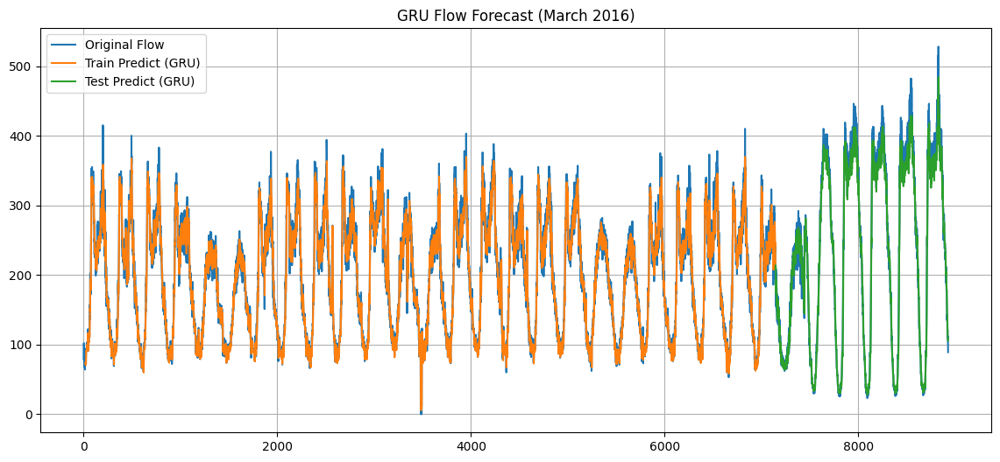

In [25]:

#  flow


#  Select one month
sensor['timestamp'] = pd.to_datetime(sensor['timestamp'])
one_month = sensor[sensor['timestamp'].dt.to_period('M') == '2016-03']
flow_series = one_month['flow'].reset_index(drop=True)

#  Normalize
scaler = MinMaxScaler(feature_range=(0, 1))
flow_scaled = scaler.fit_transform(flow_series.values.reshape(-1, 1))

#  Create supervised dataset (sliding window)
def create_dataset(dataset, look_back=20):
    X, y = [], []
    for i in range(len(dataset) - look_back - 1):
        X.append(dataset[i:i+look_back, 0])
        y.append(dataset[i+look_back, 0])
    return np.array(X), np.array(y)

look_back = 20
X, y = create_dataset(flow_scaled, look_back)

#  Train / test split (80 / 20)
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

#  Reshape to [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], look_back, 1))
X_test  = X_test.reshape((X_test.shape[0],  look_back, 1))

#  Build GRU model
model_gru = Sequential()
model_gru.add(GRU(50, input_shape=(look_back, 1)))
model_gru.add(Dense(1))
model_gru.compile(loss='mean_squared_error', optimizer='adam')

print(model_gru.summary())

#  Train
model_gru.fit(X_train, y_train, epochs=15, batch_size=1, verbose=1)

#  Predictions
trainPredict = model_gru.predict(X_train)
testPredict  = model_gru.predict(X_test)

#  Inverse scaling
trainPredict = scaler.inverse_transform(trainPredict)
testPredict  = scaler.inverse_transform(testPredict)
flow_scaled_inv = scaler.inverse_transform(flow_scaled)

#  Shift predictions for plotting
trainPredictPlot = np.empty_like(flow_scaled_inv)
trainPredictPlot[:] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back] = trainPredict

testPredictPlot = np.empty_like(flow_scaled_inv)
testPredictPlot[:] = np.nan
start = len(trainPredict) + look_back
end   = start + len(testPredict)
testPredictPlot[start:end] = testPredict

#  Plot
plt.figure(figsize=(14,6))
plt.plot(flow_scaled_inv, label="Original Flow")
plt.plot(trainPredictPlot, label="Train Predict (GRU)")
plt.plot(testPredictPlot, label="Test Predict (GRU)")
plt.title("GRU Flow Forecast (March 2016)")
plt.legend()
plt.grid(True)
plt.show()

In [61]:
y_test_real = scaler.inverse_transform(y_test.reshape(-1, 1))
y_pred_real = testPredict

# RMSE
rmse = np.sqrt(mean_squared_error(
    y_test_real[:, 0],
    y_pred_real[:, 0]
))

print("GRU FLOW — TEST RMSE:", rmse)


GRU FLOW — TEST RMSE: 3318881521876.6064
